In [1]:
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import random
%matplotlib inline
# plt.style.use('ggplot')

In [2]:
## ComplexHeadUnet

# pip install ptitprince
import pandas as pd
import ptitprince as pt

from parameters import *
from validation_run import *

Python Platform: macOS-12.6.2-arm64-arm-64bit
python version: 3.10.9 (main, Dec 15 2022, 10:44:50) [Clang 14.0.0 (clang-1400.0.29.202)]
torch version: 2.0.0.dev20221220
numpy version: 1.23.5
pandas version: 1.5.2
mps
Adjusting learning rate of group 0 to 1.0000e-03.
("test_list = ['SubMTS_16.nii', 'SubMTS_26.nii', 'SubMTS_20.nii', "
 "'SubMTS_24.nii', 'SubMTS_06.nii']")
("valid_list = ['SubMTS_16.nii', 'SubMTS_26.nii', 'SubMTS_20.nii', "
 "'SubMTS_24.nii', 'SubMTS_06.nii']")
("train_list = ['SubMTS_07.nii', 'SubMTS_21.nii', 'SubMTS_02.nii', "
 "'SubMTS_14.nii', 'SubMTS_12.nii', 'SubMTS_22.nii', 'SubMTS_25.nii', "
 "'SubMTS_05.nii', 'SubMTS_15.nii', 'SubMTS_11.nii', 'SubMTS_10.nii', "
 "'SubMTS_03.nii', 'SubMTS_17.nii', 'SubMTS_19.nii', 'SubMTS_18.nii', "
 "'SubMTS_08.nii', 'SubMTS_04.nii', 'SubMTS_09.nii', 'SubMTS_01.nii', "
 "'SubMTS_23.nii', 'SubMTS_13.nii']")


/opt/homebrew/Cellar/jupyterlab/3.4.8/libexec/lib/python3.10/site-packages/albumentations/core/composition.py:53: UserWarning: transforms is single transform, but a sequence is expected! Transform will be wrapped into list.
  warnings.warn(


Subject SubMTS_16 slice 0 was passed because EMPY is FALSE
Subject SubMTS_16 slice 1 was passed because EMPY is FALSE
Subject SubMTS_16 slice 2 was passed because EMPY is FALSE
Subject SubMTS_16 slice 3 was passed because EMPY is FALSE
Subject SubMTS_16 slice 4 was passed because EMPY is FALSE
Subject SubMTS_16 slice 5 was passed because EMPY is FALSE
Subject SubMTS_16 slice 6 was passed because EMPY is FALSE
Subject SubMTS_16 slice 7 was passed because EMPY is FALSE
Subject SubMTS_16 slice 8 was passed because EMPY is FALSE
Subject SubMTS_16 slice 9 was passed because EMPY is FALSE
Subject SubMTS_16 slice 10 was passed because EMPY is FALSE
Subject SubMTS_16 slice 11 was passed because EMPY is FALSE
Subject SubMTS_16 slice 22 was passed because EMPY is FALSE
Subject SubMTS_16 slice 23 was passed because EMPY is FALSE
Subject SubMTS_16 slice 24 was passed because EMPY is FALSE
Subject SubMTS_16 slice 25 was passed because EMPY is FALSE
Subject SubMTS_26 slice 0 was passed because EMPY 

In [3]:
for key in range(1, meta.NUM_CLASS):
    print('')
    print(f'Class_{meta.DICT_CLASS[key]}')
    
    print(
        f'DSC: '
        f'Mean - {round(np.mean(dict_class_stats[f"Dice_{meta.DICT_CLASS[key]}"]), 3)} '
        f'Median - {round(np.median(dict_class_stats[f"Dice_{meta.DICT_CLASS[key]}"]), 3)} '
        )
    
    print(
        f'Precision: '
        f'Mean - {round(np.mean(dict_class_stats[f"Precision_{meta.DICT_CLASS[key]}"]), 3)} '
        f'Median - {round(np.median(dict_class_stats[f"Precision_{meta.DICT_CLASS[key]}"]), 3)} '
        )
    
    print(
        f'Recall: '
        f'Mean - {round(np.mean(dict_class_stats[f"Recall_{meta.DICT_CLASS[key]}"]), 3)} '
        f'Median - {round(np.median(dict_class_stats[f"Recall_{meta.DICT_CLASS[key]}"]), 3)} '
        )


Class_MTS
DSC: Mean - 0.684 Median - 0.775 
Precision: Mean - 0.901 Median - 0.96 
Recall: Mean - 0.665 Median - 0.79 


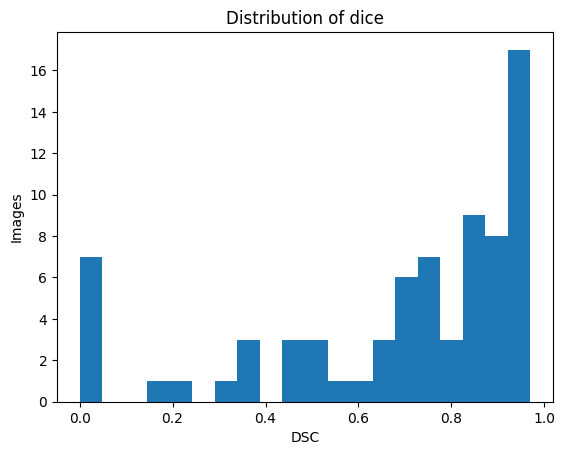

In [4]:
for key in range(1, meta.NUM_CLASS):
    create_hist(dict_class_stats[f"Dice_{meta.DICT_CLASS[key]}"])

In [5]:
for key in range(1, meta.NUM_CLASS):
    print(
        f'{meta.DICT_CLASS[key]} '
        f'{pd.DataFrame(dict_class_stats[f"Dice_{meta.DICT_CLASS[key]}"]).quantile([0.25, 0.5, 0.75])} '
)

MTS            0
0.25  0.5325
0.50  0.7750
0.75  0.9000 


/Users/aglevchuk/Documents/PycharmProjects/Unet_Cardiac/ComplexHeadUnet/validation_run.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure, ax = plt.subplots(nrows = 1, ncols = 4, figsize = (12, 12))


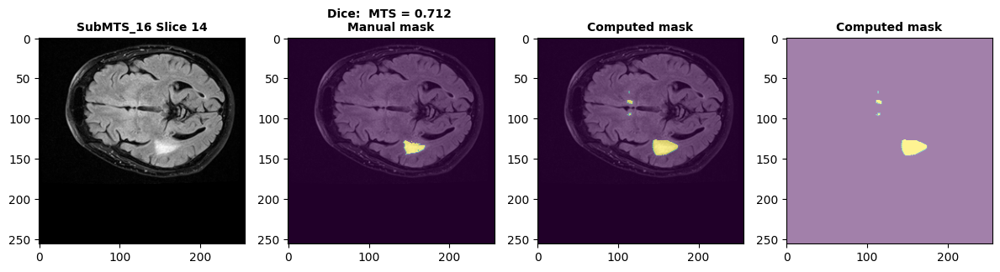

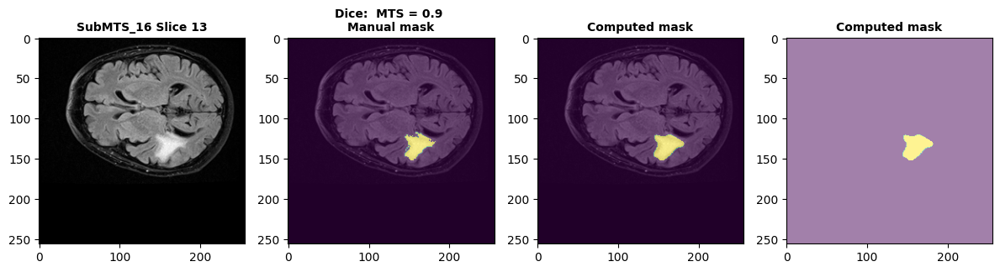

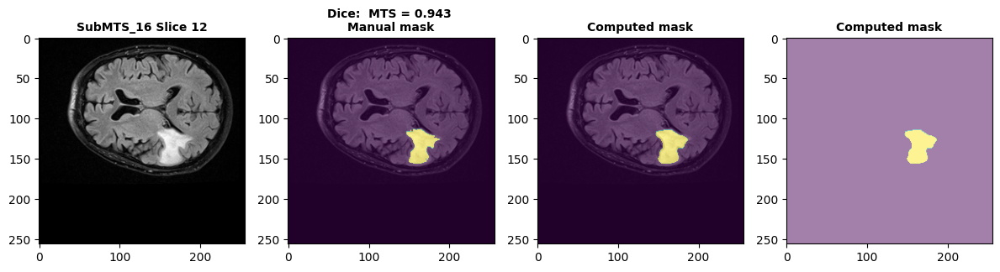

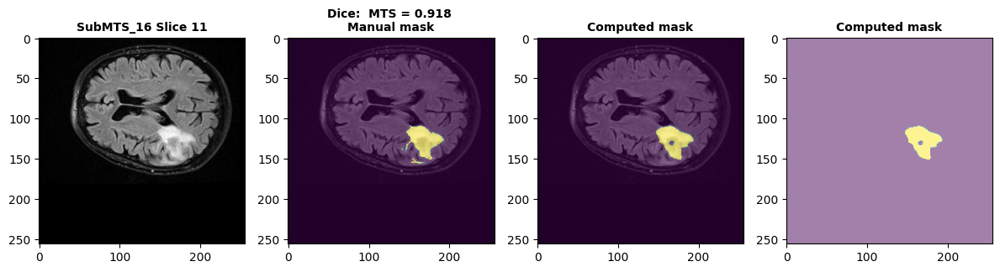

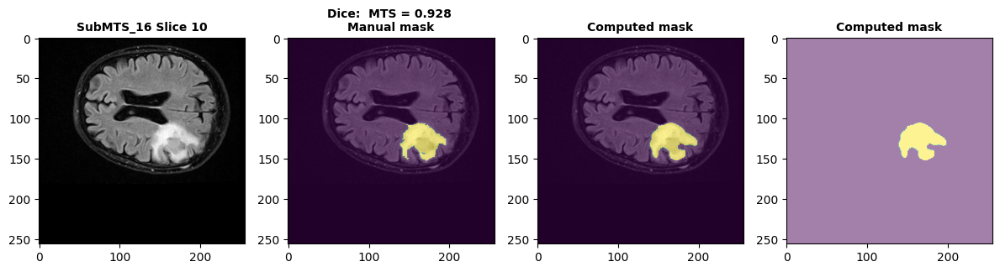

...

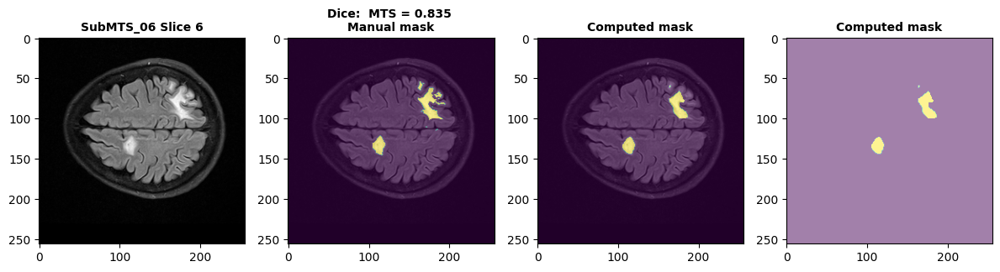

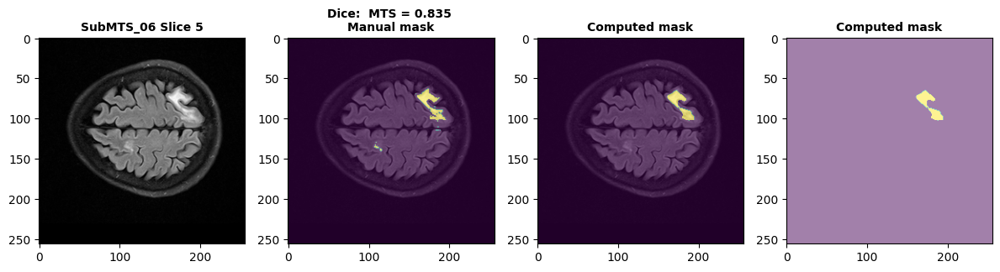

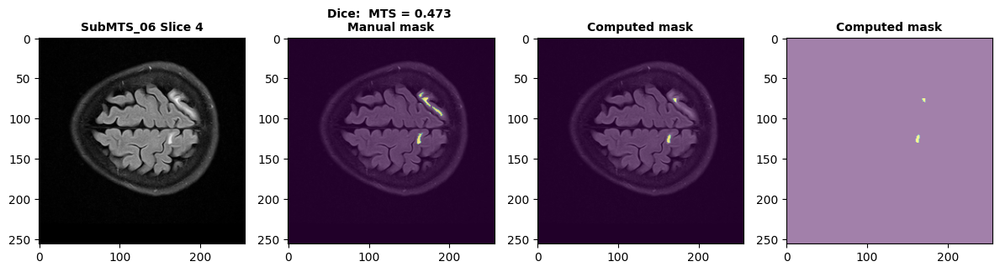

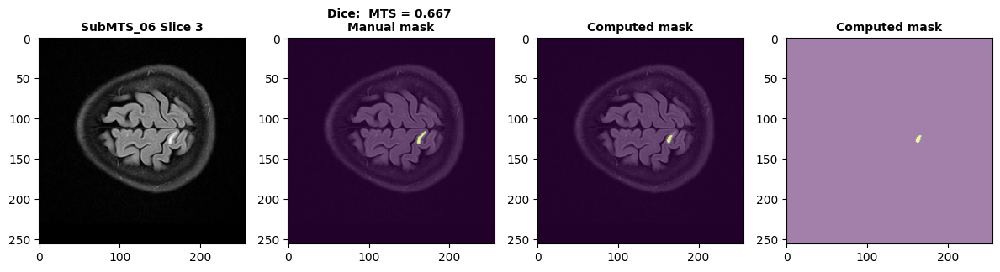

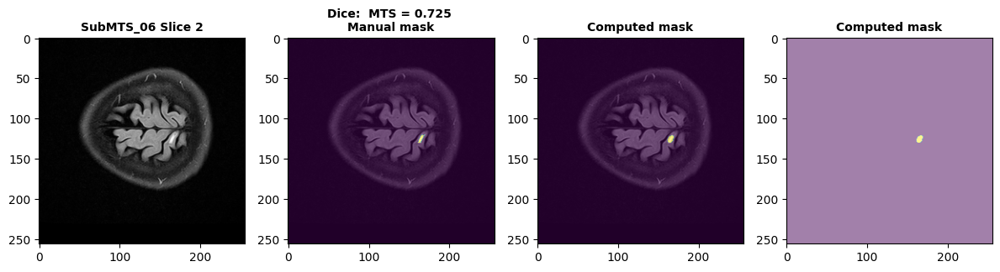

In [6]:
pltres.show_predicted(show_predicted_masks)